In [8]:
%pip install tensorflow  matplotlib pandas scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [9]:
import pathlib, random, math, shutil
import pathlib, tensorflow as tf, random
import tensorflow as tf

In [10]:
import pathlib, shutil, random, math

def split_train_test(
        root_dir,                        # carpeta que contiene train_Original/
        source_dir="DATASET",
        test_pct=0.20,
        seed=42,
        delete_existing=True,            # borra train/ y test/ si existen
        dry_run=False                    # True → solo muestra acciones
    ):
    """
    Copia las imágenes de source_dir en carpetas nuevas
    con la proporción  (1 - test_pct) / test_pct  (por defecto 80 / 20).

    Si `delete_existing` es True, elimina cualquier train/ o test/ previo.
    Acepta extensiones .jpg/.jpeg/.png.
    """
    root    = pathlib.Path(root_dir)
    src_dir = root / source_dir
    assert src_dir.exists(), f"No se encontró '{source_dir}'"

    # Borrar divisiones anteriores
    if delete_existing:
        for name in ("train", "test"):
            target = root / name
            if target.exists():
                if dry_run:
                    print(f"[DRY RUN] Eliminaría {target}")
                else:
                    shutil.rmtree(target)

    random.seed(seed)

    # Recorrer cada clase y copiar
    for cls_dir in src_dir.iterdir():
        if not cls_dir.is_dir():
            continue                                 
        imgs = [p for p in cls_dir.iterdir()
                if p.suffix.lower() in {".jpg", ".jpeg", ".png"}]
        if not imgs:
            continue

        random.shuffle(imgs)
        n_test      = math.floor(len(imgs) * test_pct)
        test_imgs   = imgs[:n_test]
        train_imgs  = imgs[n_test:]

        for split, split_imgs in [("train", train_imgs), ("test", test_imgs)]:
            dest = root / split / cls_dir.name
            if not dry_run:
                dest.mkdir(parents=True, exist_ok=True)

            for img in split_imgs:
                if dry_run:
                    print(f"[{split.upper()}] copiaría {img.name} -> {dest}")
                else:
                    shutil.copy2(img, dest)

    if dry_run:
        print("DRY RUN.")
    else:
        print("División 80-20 completada con copia y reemplazo de carpetas.")

DATASET_DIR = "./"
split_train_test(DATASET_DIR, dry_run=False)


División 80-20 completada con copia y reemplazo de carpetas.


In [11]:
from collections import Counter

def count_split(path):
    c = Counter(p.parent.name for p in pathlib.Path(path).rglob('*') if p.suffix.lower() in {'.jpg','.jpeg','.png'})
    total = sum(c.values())
    return total, c

for split in ("train", "test"):
    tot, cls = count_split(DATASET_DIR + "/" + split)
    print(f"{split.upper():5}  {tot} imágenes")
    print("   " + ", ".join(f"{k}:{v}" for k,v in cls.items()))


TRAIN  5113 imágenes
   trap-jaw-ants:520, black-crazy-ants:417, leafcutter-ants:1039, yellow-crazy-ants:468, argentine-ants:1136, weaver-ants:612, fire-ants:921
TEST   1274 imágenes
   trap-jaw-ants:129, black-crazy-ants:104, leafcutter-ants:259, yellow-crazy-ants:116, argentine-ants:284, weaver-ants:152, fire-ants:230


In [12]:
# Procesar los datos
IMG_SIZE = (224,224)
BATCH    = 16


In [13]:
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
from PIL import Image, ImageOps

def random_contrast(img):
    """
    Recibe un tensor [H, W, 3] en rango 0-1 y devuelve la misma imagen
    con contraste multiplicado por un factor aleatorio.
    """
    # ImageDataGenerator entrega un array float32 ya re-escalado (0-1)
    factor = tf.random.uniform([], 0.8, 1.2)
    img_tf = tf.image.adjust_contrast(img, factor)
    return img_tf.numpy()


# Clases a ignorar
IGNORE = []
root   = pathlib.Path("./")  

# Lista completa de carpetas dentro de train/
all_classes     = sorted([d.name for d in (root/"train").iterdir() if d.is_dir()])
include_classes = [c for c in all_classes if c not in IGNORE]

print("Classes usadas :", include_classes)
print("Classes ignoradas:", IGNORE)

train_datagen = ImageDataGenerator(
    rescale             = 1./255,
    rotation_range      = 20,
    width_shift_range   = 0.15,
    height_shift_range  = 0.15,
    zoom_range          = (0.7, 1.3),
    horizontal_flip     = True,
    vertical_flip       = True,
    fill_mode           = "wrap",
    brightness_range    = (0.8, 1.2),
    preprocessing_function = lambda img: random_contrast(img),
    validation_split    = 0.15
)


test_datagen = ImageDataGenerator(rescale = 1./255)

train_gen = train_datagen.flow_from_directory(
    os.path.join(DATASET_DIR, "train"),
    classes     = include_classes,
    target_size = IMG_SIZE,
    batch_size  = BATCH,
    subset      = "training",
    class_mode  = "categorical",
    shuffle     = True
)

val_gen = train_datagen.flow_from_directory(
    os.path.join(DATASET_DIR, "train"),
    classes     = include_classes,
    target_size = IMG_SIZE,
    batch_size  = BATCH,
    subset      = "validation",
    class_mode  = "categorical",
    shuffle     = True
)

test_gen = test_datagen.flow_from_directory(
    os.path.join(DATASET_DIR, "test"),
    classes     = include_classes,
    target_size = IMG_SIZE,
    batch_size  = BATCH,
    class_mode  = "categorical",
    shuffle     = False
)



Classes usadas : ['argentine-ants', 'black-crazy-ants', 'fire-ants', 'leafcutter-ants', 'trap-jaw-ants', 'weaver-ants', 'yellow-crazy-ants']
Classes ignoradas: []
Found 4349 images belonging to 7 classes.
Found 764 images belonging to 7 classes.
Found 1274 images belonging to 7 classes.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.06727338..1.0043176].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.005911689..0.9582031].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.008298235..0.8534424].


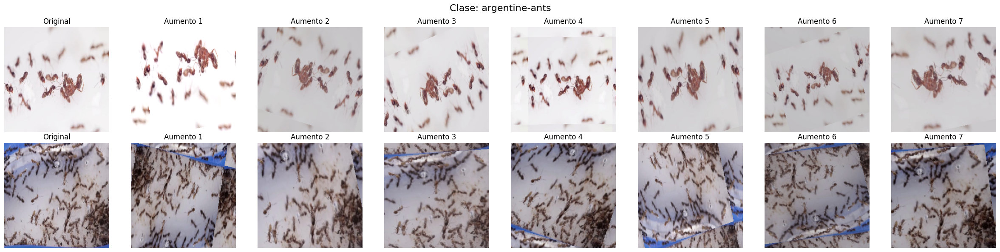

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.022864413..0.8923551].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.057893567..1.0493598].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10413603..1.0832791].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.017453132..0.8830769].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.058457956..1.0479351].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.114356615..1.0149872].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range 

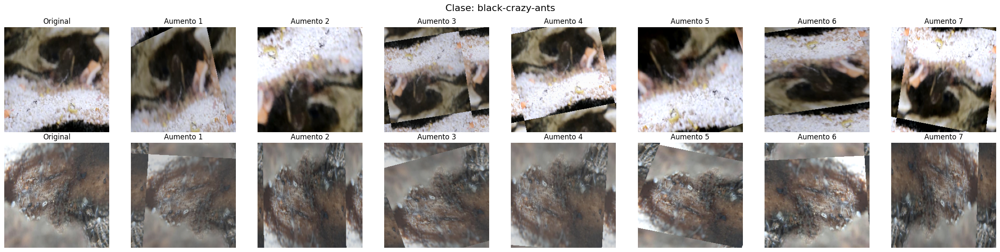

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.038919076..1.0245806].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.05947652..1.0687488].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.006220567..0.8412286].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.023276819..1.012015].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.026912356..1.0541352].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.016668133..1.0342035].


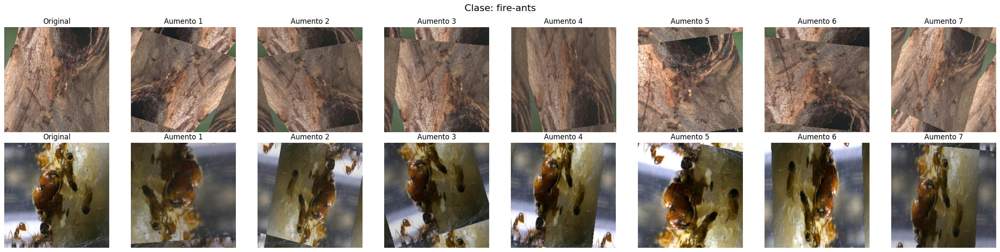

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.031260874..0.8808324].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09745859..1.0427408].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13110684..1.0587622].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.058940064..0.8993185].


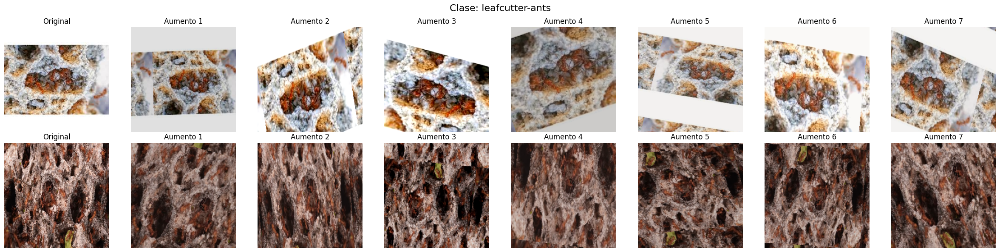

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0071289055..0.78065187].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.013147098..0.94013923].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0035304711..1.056081].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0002016898..1.0215033].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.009742509..1.0606629].


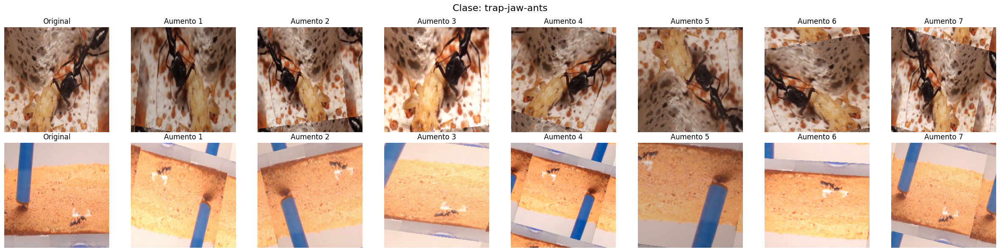

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03489212..0.93442637].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.009543039..0.901064].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03684295..0.87263614].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0052478784..1.0137763].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.042408455..1.0949392].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03360339..1.0706307].


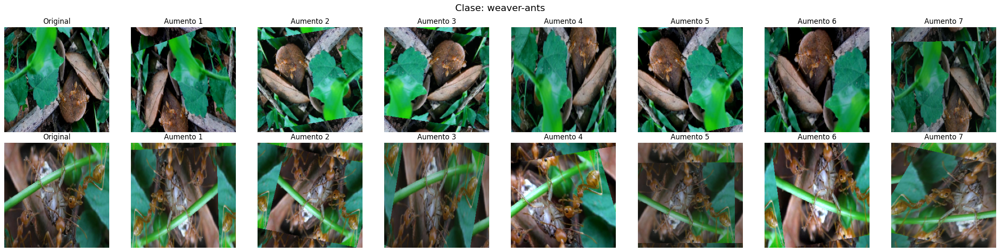

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.011362788..0.83443576].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.071040176..1.0172962].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.077259146..1.0592856].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0594615..0.93028814].


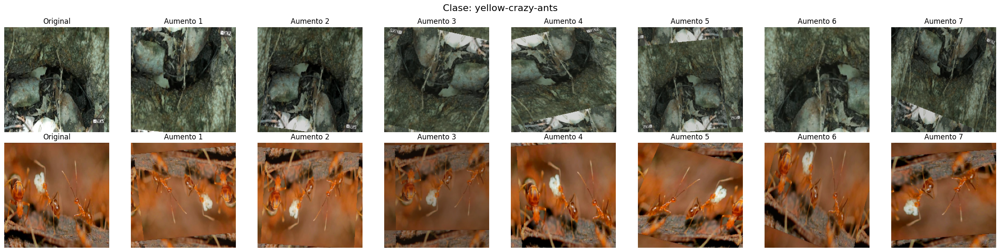

In [14]:
import os, random, numpy as np, matplotlib.pyplot as plt, tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Generador SIN aumentos (solo rescale) para extraer originales
base_datagen = ImageDataGenerator(rescale=1./255)
images_per_class = 2
augs_per_class = 7

def sample_originals(class_name):
    """Devuelve imágenes (float32 0-1) de la clase pedida."""
    class_dir = os.path.join(DATASET_DIR, "train", class_name)
    img_files = [os.path.join(class_dir, f)
                 for f in os.listdir(class_dir)
                 if f.lower().endswith((".jpg", ".jpeg", ".png"))]

    if len(img_files) == 0:
        raise ValueError(f"No se encontraron imágenes para {class_name}")

    # Si hay menos de 3 imágenes, se repiten para completar
    chosen = random.choices(img_files, k=images_per_class)

    imgs = []
    for f in chosen:
        img = tf.keras.utils.load_img(f, target_size=IMG_SIZE)
        img = tf.keras.utils.img_to_array(img) / 255.0
        imgs.append(img)
    return imgs  # lista de imagenes

for class_name in include_classes:
    originals = sample_originals(class_name)
    rows, cols = images_per_class, augs_per_class + 1
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
    fig.suptitle(f"Clase: {class_name}", fontsize=16)

    for r, orig_img in enumerate(originals):
        # Original 
        axes[r, 0].imshow(orig_img)
        axes[r, 0].set_title("Original")
        axes[r, 0].axis("off")

        # Cuatro aumentos 
        img_uint8 = (orig_img * 255).astype(np.uint8)
        aug_iter  = train_datagen.flow(np.expand_dims(img_uint8, 0),
                                       batch_size=1, shuffle=False)
        for c in range(augs_per_class):
            aug_img = next(aug_iter)[0]      # ya viene float32 0-1
            axes[r, c + 1].imshow(aug_img)
            axes[r, c + 1].set_title(f"Aumento {c + 1}")
            axes[r, c + 1].axis("off")

    plt.tight_layout()
    plt.show()


In [15]:
from tensorflow.keras import layers, models

model = models.Sequential([
    layers.Input(shape=IMG_SIZE + (3,)),
    layers.Conv2D(64, 3, activation="relu", padding="same"),
    layers.Conv2D(256, 3, activation="relu", padding="same"),
    layers.MaxPooling2D(),
    layers.Conv2D(256, 3, activation="relu", padding="same"),
    layers.MaxPooling2D(),
    layers.Conv2D(256, 3, activation="relu", padding="same"),
    layers.MaxPooling2D(),
    layers.Conv2D(256, 3, activation="relu", padding="same"),
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation="relu"),
    layers.Dense(train_gen.num_classes, activation="softmax")
])

model.compile(loss="categorical_crossentropy",
              optimizer="adam",
              metrics=["accuracy"])

model.summary()    


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 224, 224, 256)     147712    


                                                                 
 max_pooling2d (MaxPooling2  (None, 112, 112, 256)     0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 112, 112, 256)     590080    
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 56, 56, 256)       0         
 g2D)                                                            
                                                                 
 conv2d_3 (Conv2D)           (None, 56, 56, 256)       590080    
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 28, 28, 256)       0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 28, 28, 256)       590080    
          

In [ ]:

history = model.fit(
    train_gen,
    epochs=10,
    steps_per_epoch=120,
    validation_data=val_gen,
    validation_steps=25,
)

Epoch 1/10


2025-05-21 16:46:27.862603: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8907
2025-05-21 16:46:30.781786: I external/local_xla/xla/service/service.cc:168] XLA service 0x7fe34a13b1c0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-05-21 16:46:30.781846: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3070 Ti Laptop GPU, Compute Capability 8.6
2025-05-21 16:46:30.795263: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1747867590.870190    2920 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


120/120 [==============================] - 48s 299ms/step - loss: 1.8568 - accuracy: 0.2495 - val_loss: 1.9073 - val_accuracy: 0.2050
Epoch 2/10
120/120 [==============================] - 35s 295ms/step - loss: 1.6796 - accuracy: 0.3313 - val_loss: 1.7145 - val_accuracy: 0.3000
Epoch 3/10
 92/120 [======================>.......] - ETA: 6s - loss: 1.5631 - accuracy: 0.3580

In [ ]:
test_loss, test_acc = model.evaluate(test_gen)
print(f"Precisión en test: {test_acc:.2%}")

80/80 [==============================] - 8s 97ms/step - loss: 0.4688 - accuracy: 0.8532
Precisión en test: 85.32%


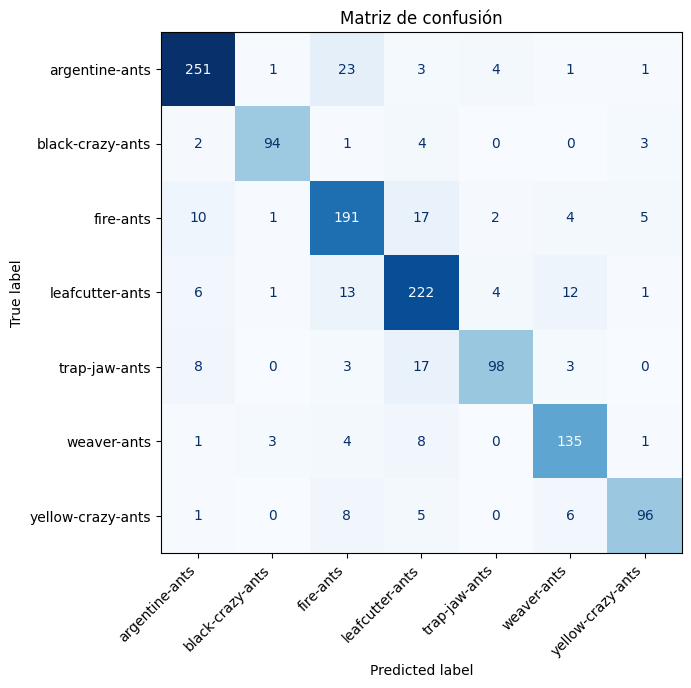

                   precision    recall  f1-score   support

   argentine-ants       0.90      0.88      0.89       284
 black-crazy-ants       0.94      0.90      0.92       104
        fire-ants       0.79      0.83      0.81       230
  leafcutter-ants       0.80      0.86      0.83       259
    trap-jaw-ants       0.91      0.76      0.83       129
      weaver-ants       0.84      0.89      0.86       152
yellow-crazy-ants       0.90      0.83      0.86       116

         accuracy                           0.85      1274
        macro avg       0.87      0.85      0.86      1274
     weighted avg       0.86      0.85      0.85      1274



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report

gen = test_gen

y_pred_prob = model.predict(gen, verbose=0)
y_pred      = np.argmax(y_pred_prob, axis=1)
y_true      = gen.classes

cm = confusion_matrix(y_true, y_pred)
labels = list(gen.class_indices.keys())   # nombres de las clases

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
fig, ax = plt.subplots(figsize=(7,7))
disp.plot(ax=ax, cmap="Blues", colorbar=False, values_format="d")
plt.xticks(rotation=45, ha="right")
plt.title("Matriz de confusión")
plt.tight_layout()
plt.show()

print(classification_report(y_true, y_pred, target_names=labels))


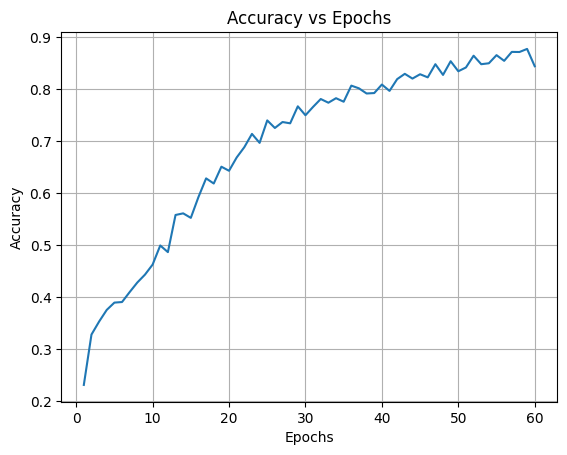

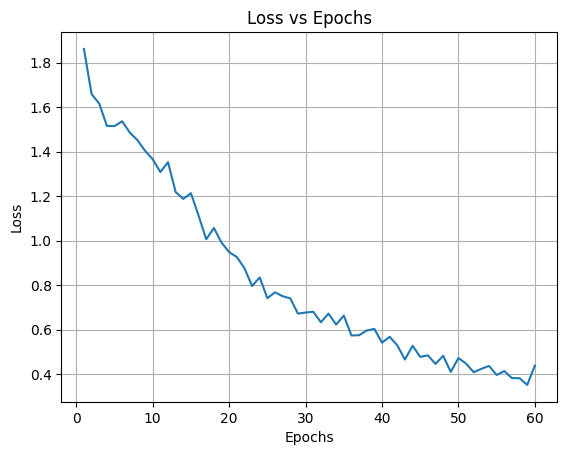

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Convert history to DataFrame
frame = pd.DataFrame(history.history)
epochs = frame.index + 1

# Accuracy vs Epochs
plt.figure(figsize=(6,4))
plt.plot(epochs, frame["accuracy"], label="Entrenamiento")
plt.plot(epochs, frame["val_accuracy"], label="Validación")
plt.title("Accuracy vs Epochs")
plt.xlabel("Épocas")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Loss vs Epochs
plt.figure(figsize=(6,4))
plt.plot(epochs, frame["loss"], label="Entrenamiento")
plt.plot(epochs, frame["val_loss"], label="Validación")
plt.title("Loss vs Epochs")
plt.xlabel("Épocas")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


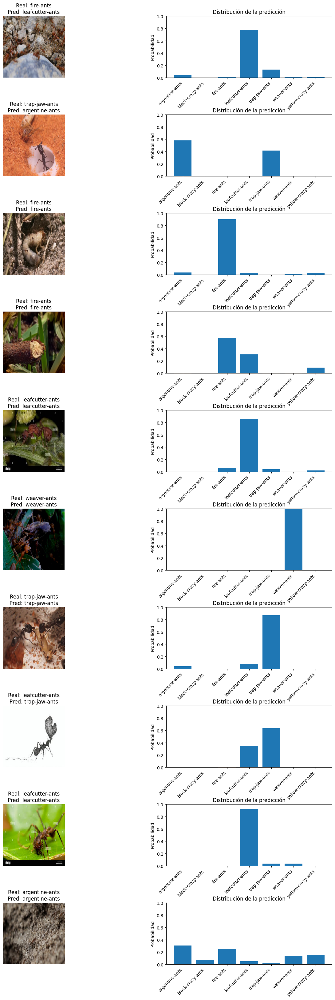

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

#config
NUM_SAMPLES = 10
class_names = list(test_gen.class_indices.keys())
num_classes = len(class_names)

# recopilar TODO el test set
imgs, labels = [], []
for i in range(len(test_gen)):            # len(test_gen) = numero de lotes
    batch_imgs, batch_lbls = test_gen[i]  # ya son np.arrays
    imgs.append(batch_imgs)
    labels.append(batch_lbls)

imgs   = np.concatenate(imgs, axis=0)
labels = np.concatenate(labels, axis=0)

# elegir N ejemplos al azar
idx            = np.random.choice(len(imgs), NUM_SAMPLES, replace=False)
sample_imgs    = imgs[idx]
sample_labels  = np.argmax(labels[idx], axis=1)

# predicciones
preds = model.predict(sample_imgs, verbose=0)

# dibujar
fig, axes = plt.subplots(NUM_SAMPLES, 2, figsize=(16, 4 * NUM_SAMPLES))
fig.subplots_adjust(hspace=0.6, wspace=0.3)

for i, (img, true_idx, pred_vec) in enumerate(zip(sample_imgs,
                                                  sample_labels,
                                                  preds)):
    # Columna de la imagen
    axes[i, 0].imshow((img * 255).astype("uint8"))   # ⇐ reescala para mostrar
    axes[i, 0].axis("off")
    axes[i, 0].set_title(f"Real: {class_names[true_idx]}\n"
                         f"Pred: {class_names[np.argmax(pred_vec)]}")

    # Columna de la distribución
    axes[i, 1].bar(range(num_classes), pred_vec)
    axes[i, 1].set_xticks(range(num_classes))
    axes[i, 1].set_xticklabels(class_names, rotation=45, ha="right")
    axes[i, 1].set_ylim([0, 1])
    axes[i, 1].set_ylabel("Probabilidad")
    axes[i, 1].set_title("Distribución de la predicción")

plt.show()



In [ ]:
# Guardar el modelo
import datetime

test_loss, test_acc = model.evaluate(test_gen, verbose=0) 
timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M")

model_name = f"modelo_{timestamp}_testAcc{test_acc:.2f}.h5"

model.save(model_name)
print(f"Modelo guardado como: {model_name}")


Modelo guardado como: modelo_20250519_1901_testAcc0.85.h5


/home/pablo/miniconda3/envs/tf216/lib/python3.11/site-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
